
<div style="border-radius:10px;
            border : #015a2c solid;
            background-color:#D7D9DB;
           font-size:110%;
           letter-spacing:0.5px;
            text-align: center">
​
<center><h1 style="padding: 25px 0px; color:#015a4c; font-weight: bold; font-family: Cursive">
Amit Project for Data Science Module <br><br>💡💡💡💡💡 <br><br> DEPI_BS_DS_R3  </h1></center>
<center><h3 style="padding-bottom: 25px; color:#025b2c; font-weight: bold; font-style:italic; font-family: Cursive">
Using Project: Trip data Ford go bike  </h3></center>     
​
</div>

# Part I - (Dataset Exploration for Ford GoBike)

### worked by (Heba Khattab/2026 )

## Introduction

.

> **Let's introduce our dataset:**


======================================

.

**This data set information was produced from `Ford GoBike` System** the information in it talked about individual rides that were made in a bike-sharing system for covering San Francisco Bay area.** 

.




> ## And here are the main exploring questions 



   **==================================================**



- What is the structure of your dataset?


- What are the main interesting features in the dataset?


- What features in the dataset supported my investigation for these interesting features?




.

> ### Also here are the investigative questions classified into three types



   **================================================**
   
   


###  <a href='#011'> Univariate Exploration</a> 

- <a href='#1'> 1 ) . What is the distribution of `User type`?</a>  
- <a href='#2'> 2 ) . What is the distribution for the `bike share users on all Trips`?</a>  
- <a href='#3'> 3 ) . What is the distribution for users' `ages`?</a>  
- <a href='#4'> 4 ) . Do the users' ages have `outlier` values?</a>
- <a href='#5'> 5 ) . What is the distribution for the trip duration in `minutes`? </a>
- <a href='#6'> 6) . What is the distribution for `member_gender`? </a>
- <a href='#7'> 7) . What is the distribution for the trip duration in `Hours`?  </a>




##  <a href='#111'> Bivariate Exploration</a> 


- <a href='#8'> 8 ) . What the `average duration` of trip for the categories of `user type`? </a>
- <a href='#9'> 9 ) . How long is the duration of the trip for `each gender` in `minutes`? </a>
- <a href='#10'> 10 ) . How long is the duration of the trip for each `user_type` in `minutes`?  </a>
- <a href='#11'> 11 ) . How the user distribution depending on their `Age` and `user_type` ?</a>
- <a href='#12'>12 ). How the user distribution depending on their `Age` and `member_gender` ?  </a>


##  <a href='#1111'> Multivariate Exploration</a> 


- <a href='#13'> 13 ) . What is the Correlation between `each` variable in the dataset?</a>  
- <a href='#14'> 14 ) . What is the Correlation between `specific numeric variables` in the dataset?</a>  
- <a href='#15'> 15 ) . What is the  Correlation between `data_stat` variables in the dataset?</a>  


##  <a href='#1100'> Conclusions </a> 





# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Import Libraries</p>

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt

import seaborn as sb
import config.config as cnf
import preprocessing
%matplotlib inline

In [3]:
# Load my dataset using pandas Dataframe
df = preprocessing.Read_data_file(cnf.fpath)


In [4]:
# here we make overview in high-level for data shape and composition
dt = preprocessing.Check_data_type(df)
print(f"data types in the dataset: \n {dt}")

data types in the dataset: 
           duration_sec start_time end_time start_station_id  \
Dtype            int64        str      str          float64   
N_unique          4752      35783    35767              329   

          start_station_name start_station_latitude start_station_longitude  \
Dtype                    str                float64                 float64   
N_unique                 329                    334                     335   

          end_station_id end_station_name end_station_latitude  \
Dtype            float64              str              float64   
N_unique             329              329                  335   

          end_station_longitude bike_id user_type member_birth_year  \
Dtype                   float64   int64       str           float64   
N_unique                    335    4646         2                75   

          member_gender bike_share_for_all_trip  
Dtype               str                     str  
N_unique              3       

the dataset has 16 columns:
duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
it has 183416 rows
**there is 329 start and end stations but there is 335 locations, extra locations should be droped
**calculate Age using the date of birth and add it as a numerical column
**


In [5]:
## check each var  datatype 
preprocessing.print_column_dtypes(df)
preprocessing.print_unique_values(df, cnf.CAT_COLS)

duration_sec: int64
start_time: str
end_time: str
start_station_id: float64
start_station_name: str
start_station_latitude: float64
start_station_longitude: float64
end_station_id: float64
end_station_name: str
end_station_latitude: float64
end_station_longitude: float64
bike_id: int64
user_type: str
member_birth_year: float64
member_gender: str
bike_share_for_all_trip: str

Unique values in 'member_gender':
<StringArray>
['Male', nan, 'Other', 'Female']
Length: 4, dtype: str

Unique values in 'user_type':
<StringArray>
['Customer', 'Subscriber']
Length: 2, dtype: str

Unique values in 'bike_share_for_all_trip':
<StringArray>
['No', 'Yes']
Length: 2, dtype: str


In [6]:
## I display 15 rows to understand the content values more 
preprocessing.show_sample(df,15)


    duration_sec start_time end_time  start_station_id  \
0          52185    32:10.1  01:56.0              21.0   
1          42521    53:21.8  42:03.1              23.0   
2          61854    13:13.2  24:08.1              86.0   
3          36490    54:26.0  02:36.8             375.0   
4           1585    54:18.5  20:44.1               7.0   
5           1793    49:58.6  19:51.8              93.0   
6           1147    55:35.1  14:42.6             300.0   
7           1615    41:06.8  08:02.8              10.0   
8           1570    41:48.8  07:59.7              10.0   
9           1049    49:47.7  07:17.0              19.0   
10           458    57:57.2  05:35.4             370.0   
11           506    56:55.5  05:21.7              44.0   
12          1176    45:12.7  04:49.2             127.0   
13           915    49:06.1  04:21.9             252.0   
14           395    56:26.8  03:01.9             243.0   

                                   start_station_name  start_station_la

In [7]:
# descriptive statistics for numeric variables
preprocessing.numeric_describe(df)

,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year
count,183416.000000,183219.000000,183416.000000,183416.000000,183219.000000,183416.000000,183416.000000,183416.000000,175151.000000
mean,726.067311,138.590365,37.771221,-122.352661,136.249401,37.771425,-122.352247,4472.890260,1984.806504
std,1794.371831,111.778938,0.099586,0.117100,111.514916,0.099494,0.116677,1664.386068,10.116589
min,61.000000,3.000000,37.317298,-122.453705,3.000000,37.317298,-122.453705,11.000000,1878.000000
25%,325.000000,47.000000,37.770083,-122.412408,44.000000,37.770407,-122.411726,3777.000000,1980.000000
50%,514.000000,104.000000,37.780760,-122.398285,100.000000,37.781010,-122.398279,4958.000000,1987.000000
75%,796.000000,239.000000,37.797280,-122.286533,235.000000,37.797320,-122.288045,5502.000000,1992.000000
max,85444.000000,398.000000,37.880222,-121.874119,398.000000,37.880222,-121.874119,6645.000000,2001.000000




> ### What is the structure of your dataset?





- The structure of the dataset contains  16 columns and 183416 rows.
 
 
- Most variables are numeric in nature , and here are **dtypes summary :**

        - float64(7)
        - int64(2)
        - str(7)
        


> ### What are the main interesting features in the dataset?




 **We got three main feature areas which are :**
 
 
 
 
- Trip duration:(duration_sec) 
 
 it tells how long people ride the bike, and can show peak patterns
 
- start & end time (start_time, end_time)
although these fields are string type, and should be converted into time, these timestamps allow extraction of [hour of day], to identify busiest hours. and day of week to find weekly patterns.
  
   
- user demographics
age distribution analysis
gender-based usage patterns



> ### What features in the dataset supported my investigation for these interesting features?



- duration_sec



- start_time, end_time



- member_birth_year, member_gender



-




- 




##  More Exploring ideas to begin my investigation

In [8]:
#This code for describing statistical data ideas in a more organized and readable table
preprocessing.numeric_stats(df)



,dtype,count,unique,missing,mean,std,min,25%,50%,75%,max
duration_sec,int64,183416.0,4752,0,726.067311,1794.371831,61.000000,325.000000,514.000000,796.000000,85444.000000
start_station_id,float64,183219.0,329,197,138.590365,111.778938,3.000000,47.000000,104.000000,239.000000,398.000000
start_station_latitude,float64,183416.0,334,0,37.771221,0.099586,37.317298,37.770083,37.780760,37.797280,37.880222
start_station_longitude,float64,183416.0,335,0,-122.352661,0.117100,-122.453705,-122.412408,-122.398285,-122.286533,-121.874119
end_station_id,float64,183219.0,329,197,136.249401,111.514916,3.000000,44.000000,100.000000,235.000000,398.000000
end_station_latitude,float64,183416.0,335,0,37.771425,0.099494,37.317298,37.770407,37.781010,37.797320,37.880222
end_station_longitude,float64,183416.0,335,0,-122.352247,0.116677,-122.453705,-122.411726,-122.398279,-122.288045,-121.874119
bike_id,int64,183416.0,4646,0,4472.890260,1664.386068,11.000000,3777.000000,4958.000000,5502.000000,6645.000000
member_birth_year,float64,175151.0,75,8265,1984.806504,10.116589,1878.000000,1980.000000,1987.000000,1992.000000,2001.000000


In [9]:
# display the information about each column
preprocessing.numeric_describe(df)


,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year
count,183416.000000,183219.000000,183416.000000,183416.000000,183219.000000,183416.000000,183416.000000,183416.000000,175151.000000
mean,726.067311,138.590365,37.771221,-122.352661,136.249401,37.771425,-122.352247,4472.890260,1984.806504
std,1794.371831,111.778938,0.099586,0.117100,111.514916,0.099494,0.116677,1664.386068,10.116589
min,61.000000,3.000000,37.317298,-122.453705,3.000000,37.317298,-122.453705,11.000000,1878.000000
25%,325.000000,47.000000,37.770083,-122.412408,44.000000,37.770407,-122.411726,3777.000000,1980.000000
50%,514.000000,104.000000,37.780760,-122.398285,100.000000,37.781010,-122.398279,4958.000000,1987.000000
75%,796.000000,239.000000,37.797280,-122.286533,235.000000,37.797320,-122.288045,5502.000000,1992.000000
max,85444.000000,398.000000,37.880222,-121.874119,398.000000,37.880222,-121.874119,6645.000000,2001.000000


## <mark>The above result show some missing values exist in some columns So let's display them </mark>

In [10]:
#yOUR CODES
preprocessing.check_nulls(df)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
null,0.0,0.0,0.0,197.000000,197.000000,0.0,0.0,197.000000,197.000000,0.0,0.0,0.0,0.0,8265.00000,8265.00000,0.0
ratio,0.0,0.0,0.0,0.107406,0.107406,0.0,0.0,0.107406,0.107406,0.0,0.0,0.0,0.0,4.50615,4.50615,0.0




> ## <mark>The result above shows many missing data </mark>



###  To fix this issue You will fill these values with median for numeric and mode for categorical

In [11]:
from importlib import reload
import preprocessing
import config.config as cnf
reload(preprocessing)
reload(cnf)


<module 'config.config' from 'c:\\Users\\newle\\OneDrive\\Desktop\\CAI-S2-G1-AI\\src\\DA\\Data science final project\\config\\config.py'>

In [12]:
# trying to fill missing values in my datset using for loop 

df = preprocessing.fill_missing_values(df)


In [13]:
#check the Nulls 
preprocessing.check_nulls(df)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ratio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### **And with a proper category for other (member gender)**

In [14]:
##  still got a missing value in the member_gender, so let's explore this column more 
cols = ['member_gender']
preprocessing.print_unique_values(df,cols)
print(df[cols].head(15))


Unique values in 'member_gender':
<StringArray>
['Male', 'Other', 'Female']
Length: 3, dtype: str
   member_gender
0           Male
1           Male
2           Male
3          Other
4           Male
5           Male
6         Female
7           Male
8          Other
9           Male
10        Female
11          Male
12          Male
13          Male
14          Male


In [15]:
# fill  dataset with missing values.
df['member_gender']=df['member_gender'].replace('Other',df['member_gender'].mode()[0],inplace=True)


In [16]:
# print(gbf.member_gender.head(15))
cols = ['member_gender']
preprocessing.print_unique_values(df,cols)
print(df[cols].head(15))


Unique values in 'member_gender':
<StringArray>
['Male', 'Female']
Length: 2, dtype: str
   member_gender
0           Male
1           Male
2           Male
3           Male
4           Male
5           Male
6         Female
7           Male
8           Male
9           Male
10        Female
11          Male
12          Male
13          Male
14          Male


In [17]:
## check my result above 
preprocessing.check_nulls(df)


,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
null,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ratio,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


> ## <mark>The result above shows that we deal with all missing data </mark>

### Now let's check duplicate value

In [18]:
##  check duplicate in dataset
df.duplicated().sum()


np.int64(4)

> ##If Not significant duplicated , so won't clean it 


### Now let's check the category columns to make more cleaning dataset 

In [19]:
### check the category columns that included object
preprocessing.Check_data_type(df)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,bike_share_for_all_trip
Dtype,int64,str,str,float64,str,float64,float64,float64,str,float64,float64,int64,str,float64,str,str
N_unique,4752,35783,35767,329,329,334,335,329,329,335,335,4646,2,75,2,2


 > ## From all previous results above I found  :
 
 
 
 **=========================================================**
 
 

> 1 ) **unique Value** as in ((`member_gender`)) : Not significant , so won't clean it



> 2 ) **Incorrect data type** as in (( `user_type` &&	`member_gender`)) :  significant change , so I need to clean it.


> 3 ) **Good factor** for marketing work as in ((`member_birth_year`)) : so I need to clean it.

In [20]:
##  step  2 ) Incorrect data type as in (( `user_type` &&	`member_gender`)) :  significant change , so  need to clean it.
cols_to_cat = ["user_type","member_gender"]
df = preprocessing.define_category_features(df,cols_to_cat)


In [21]:
## check your work 
preprocessing.Check_data_type(df[cols_to_cat])


,user_type,member_gender
Dtype,category,category
N_unique,2,2


In [22]:
## step 3 ) Good factor for marketing work as in ((`member_birth_year`)) : so need to clean it.
## To know the target audience's age and serve on them

# create a column for users' age depending on the current year
import pandas as pd
from datetime import datetime

df["age"] = datetime.now().year - df["member_birth_year"]



In [23]:
## check your work 
age_cols = ['member_birth_year', 'age']
print(df[age_cols].head(15))


    member_birth_year   age
0              1984.0  42.0
1              1987.0  39.0
2              1972.0  54.0
3              1989.0  37.0
4              1974.0  52.0
5              1959.0  67.0
6              1983.0  43.0
7              1989.0  37.0
8              1988.0  38.0
9              1992.0  34.0
10             1996.0  30.0
11             1993.0  33.0
12             1990.0  36.0
13             1987.0  39.0
14             1988.0  38.0


In [24]:
## change the new column age data type from float to int
df['age'] = df['age'].astype(int)
print(df.dtypes)

duration_sec                  int64
start_time                      str
end_time                        str
start_station_id            float64
start_station_name              str
start_station_latitude      float64
start_station_longitude     float64
end_station_id              float64
end_station_name                str
end_station_latitude        float64
end_station_longitude       float64
bike_id                       int64
user_type                  category
member_birth_year           float64
member_gender              category
bike_share_for_all_trip         str
age                           int64
dtype: object


In [25]:
## create a function to know the average users ages
def average_user_age(df, age_col="age"):
    """
    Returns the average age of users in the dataframe.
    Ignores missing values automatically.
    """
    return df[age_col].mean()

age_average = average_user_age(df)
print(age_average) 

41.09465368343002


In [26]:
## another important factor to offer  marketing services is the trip duration time 

## need to change the time from second to minute to be more usable
df["duration_min"] = df["duration_sec"]/60
print(df["duration_min"].head(15))



0      869.750000
1      708.683333
2     1030.900000
3      608.166667
4       26.416667
5       29.883333
6       19.116667
7       26.916667
8       26.166667
9       17.483333
10       7.633333
11       8.433333
12      19.600000
13      15.250000
14       6.583333
Name: duration_min, dtype: float64


In [27]:
## I need to change the time from second to Houre  to be more usable
df["duration_hrs"] = df["duration_sec"]/3600
print(df["duration_hrs"].head(15))



0     14.495833
1     11.811389
2     17.181667
3     10.136111
4      0.440278
5      0.498056
6      0.318611
7      0.448611
8      0.436111
9      0.291389
10     0.127222
11     0.140556
12     0.326667
13     0.254167
14     0.109722
Name: duration_hrs, dtype: float64


In [28]:
## check your work 
print(df.head(15))


    duration_sec start_time end_time  start_station_id  \
0          52185    32:10.1  01:56.0              21.0   
1          42521    53:21.8  42:03.1              23.0   
2          61854    13:13.2  24:08.1              86.0   
3          36490    54:26.0  02:36.8             375.0   
4           1585    54:18.5  20:44.1               7.0   
5           1793    49:58.6  19:51.8              93.0   
6           1147    55:35.1  14:42.6             300.0   
7           1615    41:06.8  08:02.8              10.0   
8           1570    41:48.8  07:59.7              10.0   
9           1049    49:47.7  07:17.0              19.0   
10           458    57:57.2  05:35.4             370.0   
11           506    56:55.5  05:21.7              44.0   
12          1176    45:12.7  04:49.2             127.0   
13           915    49:06.1  04:21.9             252.0   
14           395    56:26.8  03:01.9             243.0   

                                   start_station_name  start_station_la


# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Univariate Exploration</p>
# <a id="011"> Univariate Exploration</a>



> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables.




# <a id="1"> 1 ) . What is the distribution for User type?</a>

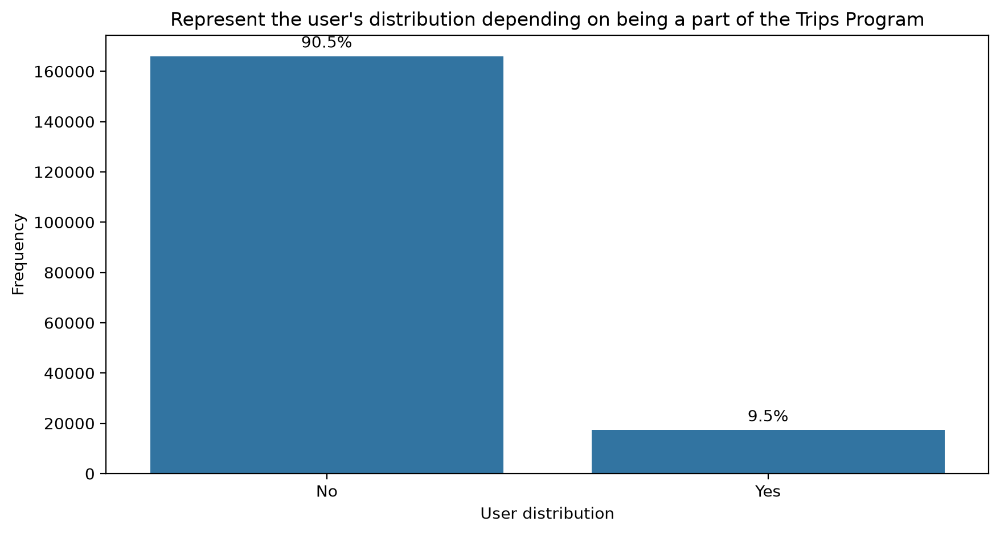

In [43]:
## I will import seaborn library to support me in making visualizations 

import seaborn as sns
plt.figure(figsize = (10,5), dpi = 200)

plot = sns.countplot(data=df, x='bike_share_for_all_trip')

plt.xlabel('User distribution')
plt.ylabel('Frequency')
plt.title("Represent the user's distribution depending on being a part of the Trips Program")

# Get counts
total = len(df)
counts = df['bike_share_for_all_trip'].value_counts()

# Add percentage labels
for container in plot.containers:
    labels = []
    for bar in container:
        height = bar.get_height()
        pct = height / total * 100
        labels.append(f"{pct:.1f}%")
    plot.bar_label(container, labels=labels, padding=3)

plt.show()

> ### <mark>Your analsys and exploration here </mark>
very small percentage of the users 9.5% are part of the bike share program.

# <a id="2"> 2 ) What is the distribution for the bike share users on all Trips?</a>

> ### <mark>Your analsys and exploration here </mark>

In [44]:
import plotly.express as px
fig = px.pie(df, names = "bike_share_for_all_trip",
       title="<b> distribution of bike share users pie plot</b>",
       color_discrete_sequence=px.colors.qualitative.Pastel,
       hole=0.4
       
       )
fig.update_layout(annotations = [dict(text= "bike_share_for_all_trip", font_size=20, x=0.5, y =0.5, showarrow = False)])

from the above pie chart we can see that 90.5% of the users are not bike share users, while only 9.5% are users.

# <a id="3"> 3 ) What is the distribution for users' ages? </a>

> ### <mark>Your analsys and exploration here </mark>

Text(0, 0.5, 'number of trips')

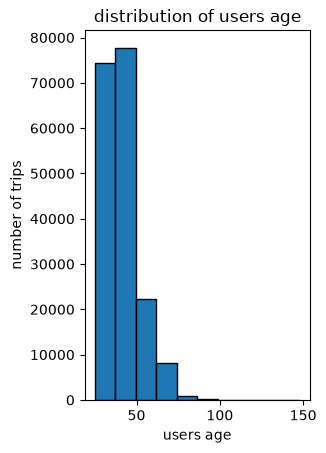

In [48]:
# visualizing age using historgram chart
plt.Figure(figsize=(9*len(df['age']),4))
plt.subplot(1,2,1)
plt.hist(df['age'], edgecolor = "black")
plt.title(f"distribution of users age")
plt.xlabel("users age")
plt.ylabel("number of trips")


# <a id="4">  4 ) . Do the users' ages have outlier values?</a>


> ### <mark>Your analsys and exploration here </mark>

from the boxchart we can see there is outliers in the age values so we run further investigation. using IQR, lower and upper fences was calculated and upper outliers were identified.

Text(0.5, 1.0, 'Age boxplot')

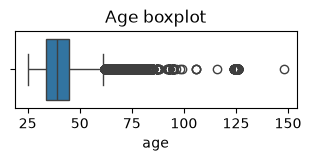

In [ ]:
plt.figure(figsize=(8,1))
plt.subplot(1,2,1)
sns.boxplot(df["age"],orient='h')
plt.title(f"Age boxplot")


In [50]:
#finding outliers and lower and upper fences
Q1 = df["age"].quantile(.25)
Q3 = df["age"].quantile(0.75)
IQR = Q3 - Q1

lower_fence = Q1 - 1.5*IQR
upper_fence = Q3 + 1.5*IQR

print(f"\nColumn: age")
print(f"Q1={Q1}, Q3={Q3}, IQR={IQR}")
print(f"Lower fence={lower_fence}, Upper fence={upper_fence}")

lower_outliers = df[df["age"] < lower_fence]["age"].values
print(f"age lower outliers:\n {lower_outliers}")

upper_outliers = df[df["age"] > upper_fence]["age"].values
print(f"age upper outliers:\n {upper_outliers}")
##replacing outliers with upper or lower fence values
#df[col] = df[col].replace(lower_outliers, lower_fence)
#df[col] = df[col].replace(upper_outliers, upper_fence)



Column: age
Q1=34.0, Q3=45.0, IQR=11.0
Lower fence=17.5, Upper fence=61.5
age lower outliers:
 []
age upper outliers:
 [67 67 67 ... 76 81 99]


# <a id="5">  5 ) . What is the distribution for the trip duration in minutes? </a>

In [58]:
## Review the statistic for trip duration in minutes
df["duration_min"].describe()

count    183416.000000
mean         12.101122
std          29.906197
min           1.016667
25%           5.416667
50%           8.566667
75%          13.266667
max        1424.066667
Name: duration_min, dtype: float64

Text(0, 0.5, 'number of trips')

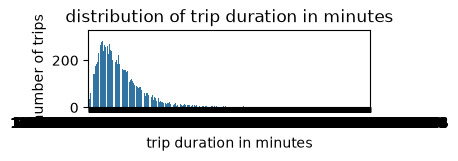

In [ ]:
# Make visualization to easy get insight

plt.figure(figsize=(8,1))
plt.subplot(1,2,1)
#plt.hist(df['duration_min'], edgecolor = "black")
sns.countplot(x = df["duration_min"], data=df)
plt.title(f"distribution of trip duration in minutes")
plt.xlabel("trip duration in minutes")
plt.ylabel("number of trips")


> ### <mark>Your analsys and exploration here </mark>


# <a id="6"> 6 ) . What is the distribution for member_gender?</a>

In [62]:
# Make visualization to easy get insight
import plotly.express as px
fig = px.pie(df, names = "member_gender",
       title="<b> distribution of members gender chart</b>",
       color_discrete_sequence=px.colors.qualitative.Pastel,
       hole=0.4
        )
fig.update_layout(annotations = [dict(text= "member_gender", font_size=20, x=0.5, y =0.5, showarrow = False)])

> ### <mark>Your analsys and exploration here </mark>
22.3% of the members are females, while 77.7% of members are male.

# <a id="7">    7 )  . What is the distribution for the trip duration in Hours?  </a>

In [64]:
df["duration_hrs"].describe()

count    183416.000000
mean          0.201685
std           0.498437
min           0.016944
25%           0.090278
50%           0.142778
75%           0.221111
max          23.734444
Name: duration_hrs, dtype: float64

Text(0, 0.5, 'Frequency')

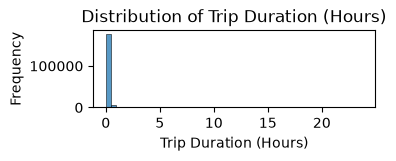

In [72]:
# Make visualization to easy get insight
plt.figure(figsize=(8,1))
plt.subplot(1,2,1)
sns.histplot(df["duration_hrs"], bins=50)
plt.title("Distribution of Trip Duration (Hours)")
plt.xlabel("Trip Duration (Hours)")
plt.ylabel("Frequency")


> ### <mark>Your analsys and exploration here </mark>
most trips are short so the data is left skewed. 

### The variables distribution:


> The distribution of duration present that most of the trips were less than 30 minutes ( we can notice that from the minutes and the hour charts )


> And the Age distribution is ( left Skewed ) as most users age are  22 - 39


> Most users are subscribers, not Customers and  Males as shown in the charts above.



### Were there any interesting and outliers 


- We got Age outliers for for more than 100 .



- The distribution of duration was strange where the minutes and the hour charts were 30 minutes or less.

# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Bivariate Exploration</p>
# <a id="111"> Bivariate Exploration</a>

Now let's investigate relationships between pairs of variables in our data.

# <a id="8"> 8) . What the average duration of trip for the categories of user type?</a>

In [80]:
# Distribution of Age by user types
stats = pd.concat([df["age"].describe(), df["user_type"].describe()], axis=1)
stats.columns = ["age", "user_type"]
print(stats)



                  age   user_type
count   183416.000000      183416
mean        41.094654         NaN
std          9.896492         NaN
min         25.000000         NaN
25%         34.000000         NaN
50%         39.000000         NaN
75%         45.000000         NaN
max        148.000000         NaN
unique            NaN           2
top               NaN  Subscriber
freq              NaN      163548


# Make visualization to easy get insight


Text(0.5, 1.0, 'Age Distribution by User Type')

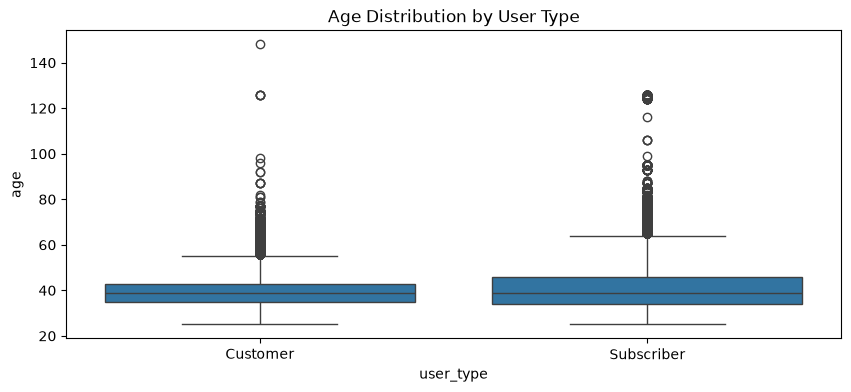

In [81]:
plt.figure(figsize=(10,4))
sns.boxplot(x="user_type", y="age", data=df)
plt.title("Age Distribution by User Type")


> ### <mark>Your analsys and exploration here </mark>
the age distribution for user types is almost the same for customers and subscribers. with both having some age outliers 

# <a id="9">    9 ) . How long is the duration of the trip for each gender in minutes?  </a>

Text(0.5, 1.0, 'trip duration in minutes Distribution by gender')

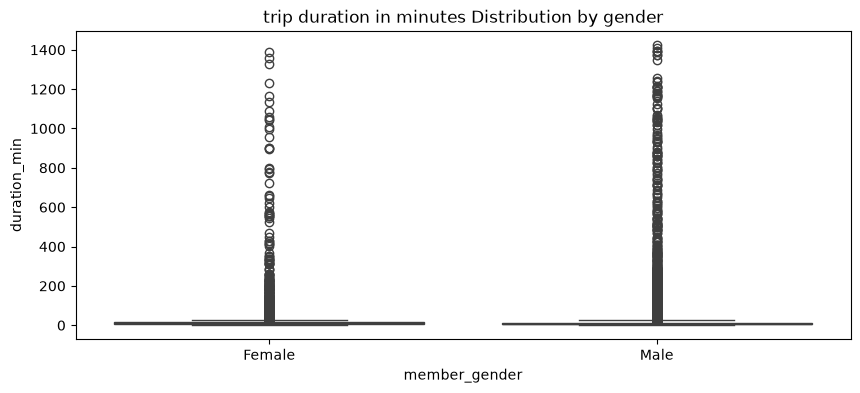

In [85]:
# Make visualization to easy get insight
plt.figure(figsize=(10,4))
sns.boxplot(x="member_gender", y="duration_min", data=df)
plt.title("trip duration in minutes Distribution by gender")

# ------------------------Duration distribution by member gender



# Make visualization to easy get insight


> ### <mark>Your analsys and exploration here </mark>
male trips are longer in duration.

# <a id="10 "> 10 ) . How long is the duration of the trip for each user_type in minutes?  </a>

Text(0, 0.5, 'Trip Duration (Minutes)')

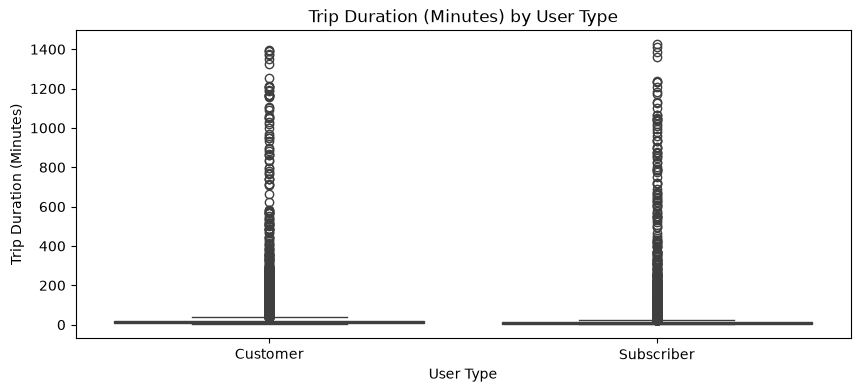

In [86]:

# Make visualization to easy get insight
plt.figure(figsize=(10,4))
sns.boxplot(x="user_type", y="duration_min", data=df)
plt.title("Trip Duration (Minutes) by User Type")
plt.xlabel("User Type")
plt.ylabel("Trip Duration (Minutes)")


> ### <mark>Your analsys and exploration here </mark>

# <a id="11">  11 ) . How the user distribution depending on their Age and user_type ? </a>

Text(0, 0.5, 'Age')

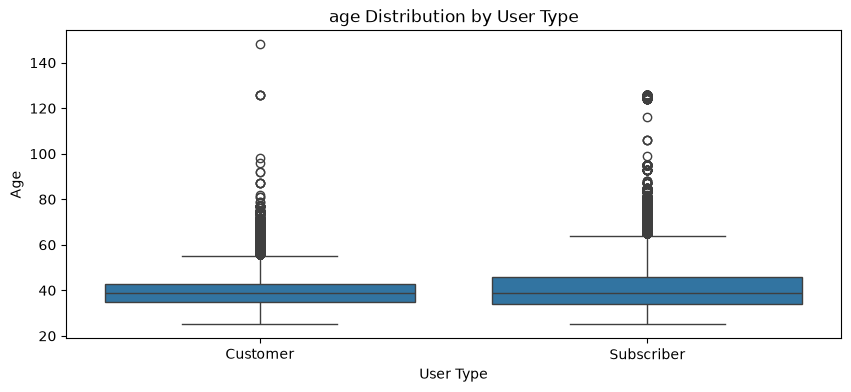

In [88]:

# Make visualization to easy get insight

# Make visualization to easy get insight
plt.figure(figsize=(10,4))
sns.boxplot(x="user_type", y="age", data=df)
plt.title("age Distribution by User Type")
plt.xlabel("User Type")
plt.ylabel("Age")


> ### <mark>Your analsys and exploration here </mark>

#  <a id="12"> 12 ). How the user distribution depending on their Age and member_gender ?</a>

Text(0, 0.5, 'age')

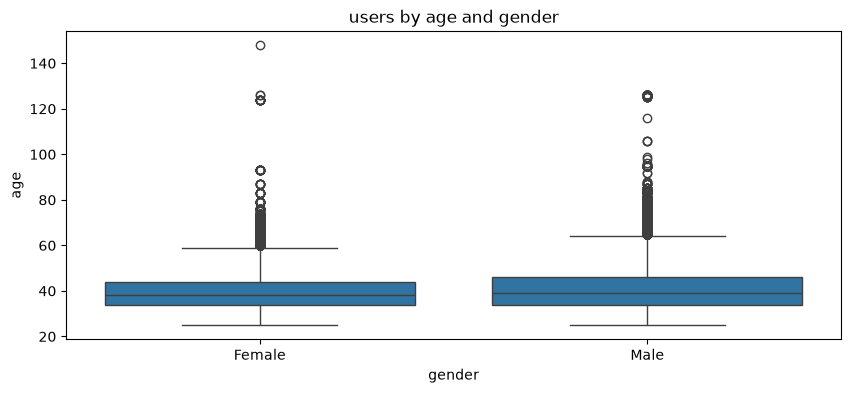

In [89]:
# Make visualization to easy get insight

plt.figure(figsize=(10,4))
sns.boxplot(x="member_gender", y="age", data=df)
plt.title("users by age and gender")
plt.xlabel("gender")
plt.ylabel("age")


> ### <mark>Your analsys and exploration here </mark>

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> ...................


### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> ....................

# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Multivariate Exploration</p>
# <a id="1111"> Multivariate Exploration </a>

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

<Axes: >

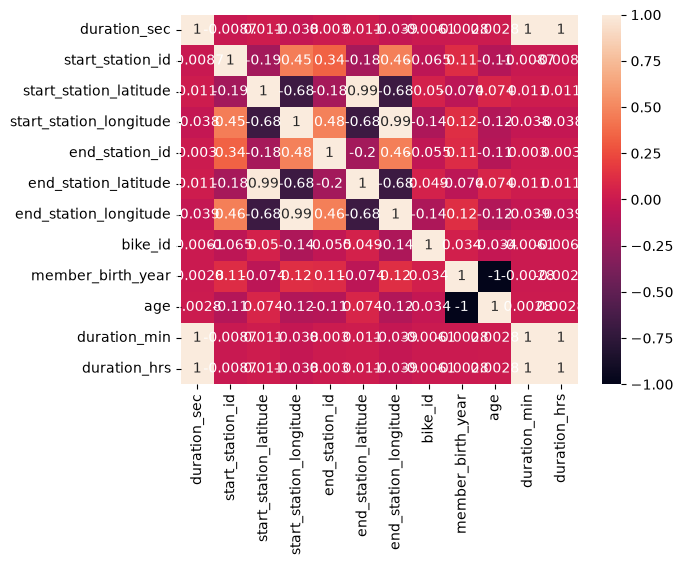

In [91]:
n_cols = df.select_dtypes("number").columns
corr = df[n_cols].corr()
plt.Figure(figsize=(2,2))
sns.heatmap(corr, annot=True)

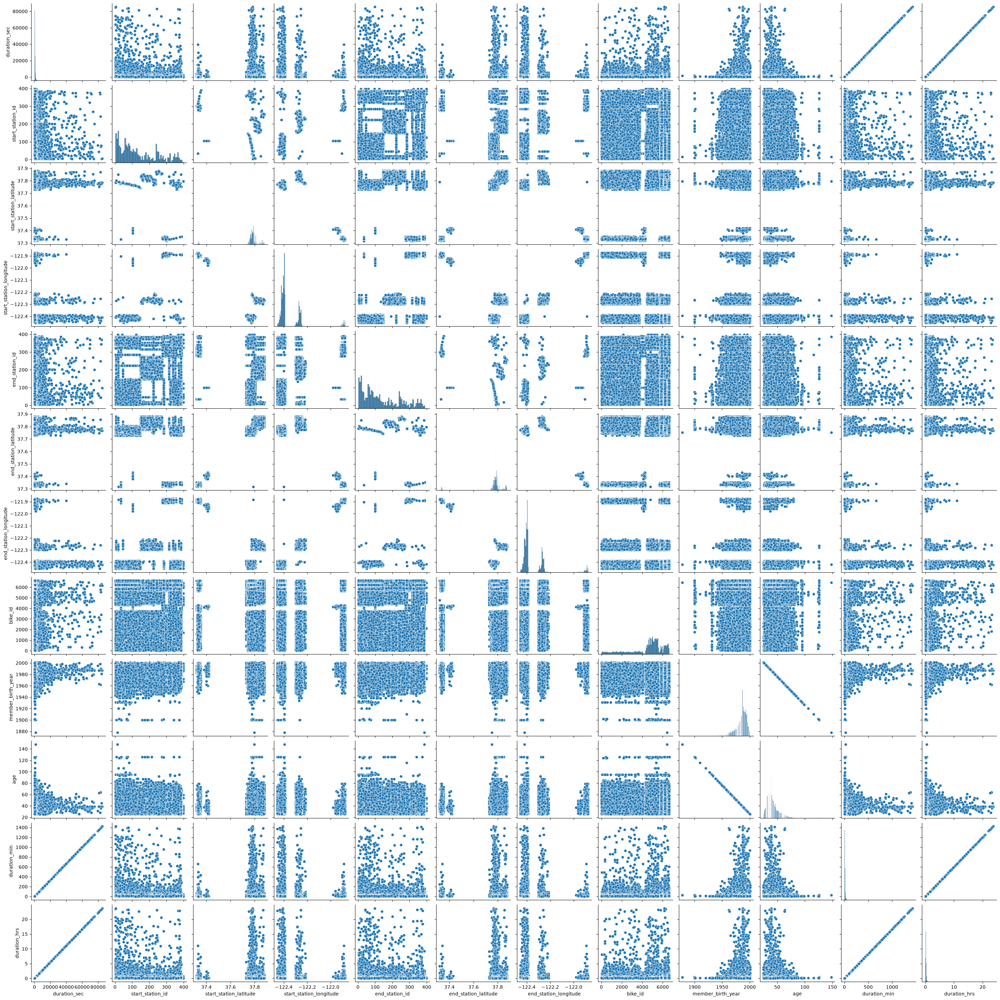

In [90]:
## check your work 
sns.pairplot(df)


# <a id="13">  13 ) . What is the  Correlation between each variable in the dataset?</a>

In [93]:
# Make visualization to easy get insight
n_cols = df.select_dtypes("number").columns
corr = df[n_cols].corr()
#corr = df.corr()
print(corr)


                         duration_sec  start_station_id  \
duration_sec                 1.000000         -0.008681   
start_station_id            -0.008681          1.000000   
start_station_latitude       0.010519         -0.188387   
start_station_longitude     -0.037935          0.454964   
end_station_id               0.003030          0.336312   
end_station_latitude         0.010880         -0.177250   
end_station_longitude       -0.038912          0.462474   
bike_id                     -0.006130         -0.064604   
member_birth_year           -0.002805          0.111319   
age                          0.002805         -0.111319   
duration_min                 1.000000         -0.008681   
duration_hrs                 1.000000         -0.008681   

                         start_station_latitude  start_station_longitude  \
duration_sec                           0.010519                -0.037935   
start_station_id                      -0.188387                 0.454964   
star



> ### <mark>Your analsys and exploration here </mark>

Example usage
- There is `no Correlation` for any variable with time ( `duration sec /minutes/hours`)



# <a id="14"> 14 )  .  What is the  Correlation between `specific numeric variables` in the dataset?</a>


In [41]:
# Make visualization to easy get insight




> ### <mark>Your analsys and exploration here </mark>

Example usage
- There is `no Correlation` for any variable with time ( `duration sec /minutes`)




- 




- 




# <a id="15">  15 ) What is the  Correlation between data_stat variables in the dataset?</a>


<Axes: >

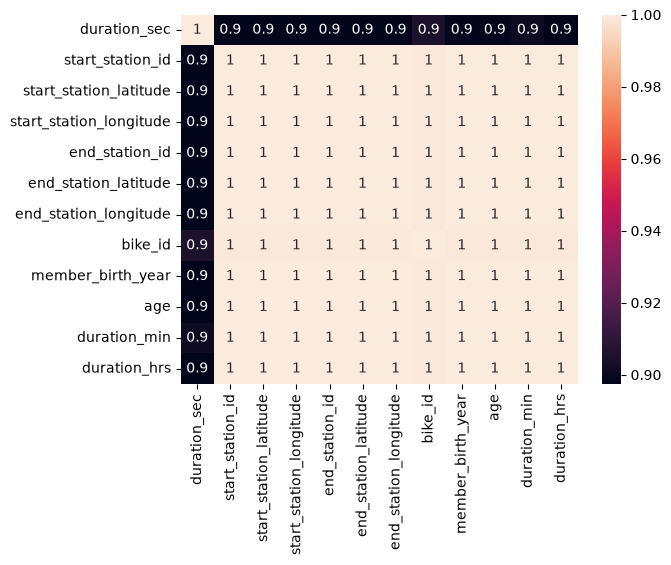

In [94]:

"""""This time I will use heatmap  to explain how Correlation between data_stat variables

in the dataset in more clear and specific percentage"""

# Make visualization to easy get insight
data_stat = df.describe()
corr = data_stat.corr()
plt.Figure(figsize=(2,2))
sns.heatmap(corr, annot=True)


> ### <mark>The above charts show how Correlation between specific numeric variables in the dataset using heatmap plots  </mark>



**Actually the `heat map`  display the above ideas in clear percentages**



- There is `no Correlation` for any variable with time ( `duration sec /minutes`)




- There is a `negative  Correlation` between  member_birth_year  and age which normal.




- There is `no significant Correlation` for any variable with `bike_id `



# <p style="border-radius:15px;border-style:solid;border-color:lightblue;border-width:3px;background-color:lightblue;padding: 20px;font-family:Verdana;color:#D81F26;font-size:30px;text-align: center;">Conclusions</p>
# <a id="1100"> Conclusions </a>

#example
- Most users were Male.


- 

- 

- 



## limitation 
example
- We got missing data which we fix some of them .

- 
